# The Moon displacement map.
Tutorial by [RnD Team](https://rnd.team).

The Moon elevation model is a great example of a large data sample that is not trivial to display at once with a generic approach. There are samples 8GB/22GB of data in 118m/59m resolution available. We'll visualize it in Python with [PlotOptiX](https://plotoptix.rnd.team), in two ways: preparing a triangular mesh with nodes for each data point ([here](https://github.com/rnd-team-dev/plotoptix/blob/master/examples/3_projects/moon/making_the_moon__mesh__remote.ipynb)), and using the data as a displacement map applied to the sphere (this notebook). Read the [article](https://medium.com/@sulej.robert/the-moon-made-twice-at-home-a2cb73b3f1e8) for all details.

![moon ray_traced](https://plotoptix.rnd.team/images/moon_2res_banner.jpg "The Moon ray-traced")

This notebook implements visualization of the Moon surface color and elevation data using the displacement map. GPU memory usage is significantly lower with this approach compared to a standard triangular mesh, allowing much more details to be displayed. However, the computation time is high. Each ray-surface intersection is calculated with a brute force loop, starting at the ideal sphere surface and progressing with small steps until the displaced surface is crossed.

Ray-tracing output in this notebook is displayed inline. It makes possible running the code on a remote server, however, interactive GUI is not available.

- to run this notebook locally, in Linux or Windows: follow [PlotOptiX installation](https://plotoptix.rnd.team/home.html#installation) steps;
- to run on a [Google Cloud Platform](https://cloud.google.com), follow [these instructions](https://github.com/rnd-team-dev/plotoptix/blob/master/examples/3_projects/moon/setup_gcp_for_python_notebooks.txt).

## 1. Collect data files.

### Surface elevation.

The Moon surface elevation model is based on data from the Lunar Orbiter Laser Altimeter (LOLA). Data is provided by LOLA Science Team in [118m resolution](https://astrogeology.usgs.gov/search/details/Moon/LRO/LOLA/Lunar_LRO_LOLA_Global_LDEM_118m_Mar2014/cub) (used in this notebook), and by LOLA/Kaguya Team in [59m resolution](https://astrogeology.usgs.gov/search/map/Moon/LRO/LOLA/Lunar_LRO_LOLAKaguya_DEMmerge_60N60S_512ppd), if you'd like to go for a crazy detailed Moon. Data is stored as a single image file, in 16-bit grayscale TIFF format so you need a good tool to read this into the memory and do some preprocessing. 

### Surface color.

The high-resolution color data comes from [Lunar Reconnaissance Orbiter Camera (LROC)](http://lroc.sese.asu.edu/posts/801). The polar regions I completed with lower resolution textures. Color details are most important when viewed from the light source direction. It is less significant with the side lighting when the shadows of the terrain bring out much more details.

### Stars.

We'll use a map in celestial coordinates from NASA, available at https://svs.gsfc.nasa.gov/3895. Credit goes to: NASA/Goddard Space Flight Center Scientific Visualization Studio.

The highest resolution star map is 16k. We'll get that one and downscale it as needed. It is only a decoration for our Moon visualization so let's not make it the main factor filling the GPU memory. Though the stars and Milky Way are real and the environment texture looks best at the highest resolution.

In [1]:
import os, urllib.request
from plotoptix.install import download_file_from_google_drive

if not os.path.isdir("data"): os.mkdir("data")

# surface elevation (8GB, can take a while!)
elevation_file = "data/Lunar_LRO_LOLA_Global_LDEM_118m_Mar2014.tif"
if not os.path.isfile(elevation_file):
    print("Downloading elevation data...")
    url = "http://planetarymaps.usgs.gov/mosaic/Lunar_LRO_LOLA_Global_LDEM_118m_Mar2014.tif"
    urllib.request.urlretrieve (url, elevation_file)

# surface color (71MB)
color_file = "data/moon_color_10k_8bit.tif"
if not os.path.isfile(color_file):
    print("Downloading color data...")
    fid = "1gJeVic597BUAkpz1GgCYRMJVninKEDKB"
    download_file_from_google_drive(fid, color_file)

# stars (132MB)
starmap_file = "data/starmap_16k.tif"
if not os.path.isfile(starmap_file):
    print("Downloading star map...")
    url = "https://svs.gsfc.nasa.gov/vis/a000000/a003800/a003895/starmap_16k.tif"
    urllib.request.urlretrieve (url, starmap_file)

print("Data is ready.")

Data is ready.


## 2. Prepare data.

Downscale data to what your hardware can handle. Displacement map does not take as much memory as the triangular mesh, it is just one 4-byte, single-precision value per data point. This means about 260M points / 1GB, so you can display about 10x more data. Color data is projected on the surface independently from the displacement and can have a different resolution in this implementation. Sufficient downscale factor for 118m resolution data should be 2 or 3 for today's GPU's.

In [2]:
%matplotlib notebook
import matplotlib.pyplot as plt
import numpy as np
import cv2

from plotoptix.utils import read_image

### Elevation data

Images of *n*GB size are not possible to read with OpenCV. PlotOptiX's utils can manage such huge files: image is decoded directly into numpy's ndarray.

In [3]:
elev_src = read_image(elevation_file)
if elev_src is not None:
    print("Dimensions:", elev_src.shape)
    print("Data type:", elev_src.dtype)
    print("Size: %.2f GB" % (elev_src.nbytes / (1024**3)))
else: print("Failed on the image reading.")

Dimensions: (46080, 92160)
Data type: uint16
Size: 7.91 GB


**Downscale factor:** 3 should be fine with 6GB GPU's.

In [4]:
downscale = 3

In [5]:
elev_src.dtype = np.int16
scale = 1. / np.iinfo(np.int16).max

h = elev_src.shape[0] // downscale
w = elev_src.shape[1] // downscale

elevation = elev_src.reshape(1, h, downscale, w, downscale).mean(4, dtype=np.float32).mean(2, dtype=np.float32).reshape(h, w)
elevation *= scale

elev_src = None # release memory

print("Dimensions:", elevation.shape)
print("Data type:", elevation.dtype)
print("Size: %.2f GB" % (elevation.nbytes / (1024**3)))

Dimensions: (15360, 30720)
Data type: float32
Size: 1.76 GB


<IPython.core.display.Javascript object>


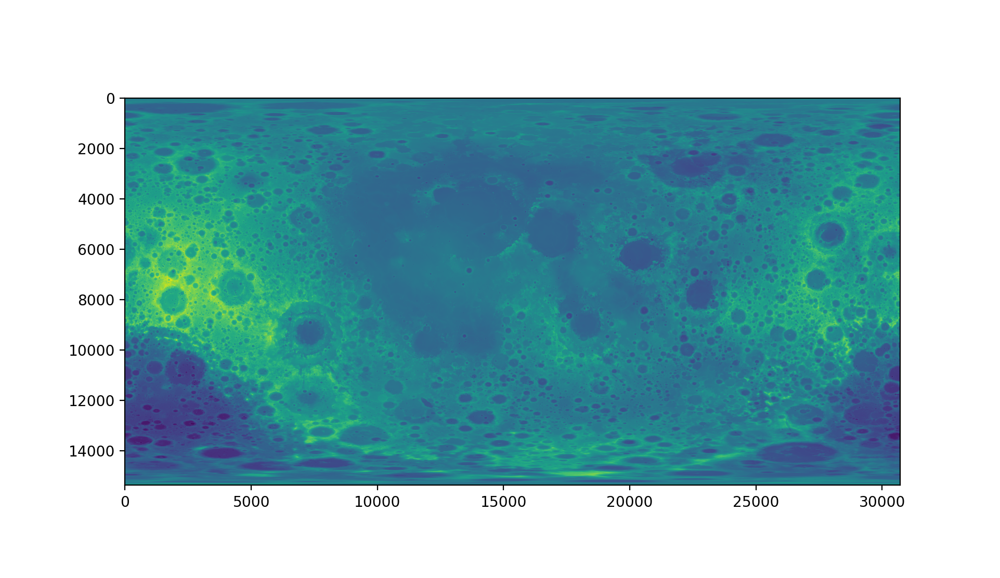

In [6]:
plt.figure(1, figsize=(9.5, 5.5))
plt.tight_layout()
imgplot = plt.imshow(elevation)

### Surface color map.

No need to resize color data, only scale color values to ``[0; 1]`` range (and add some margin on both, shadows and highlights, for a better look of the ray-traced image).

<IPython.core.display.Javascript object>


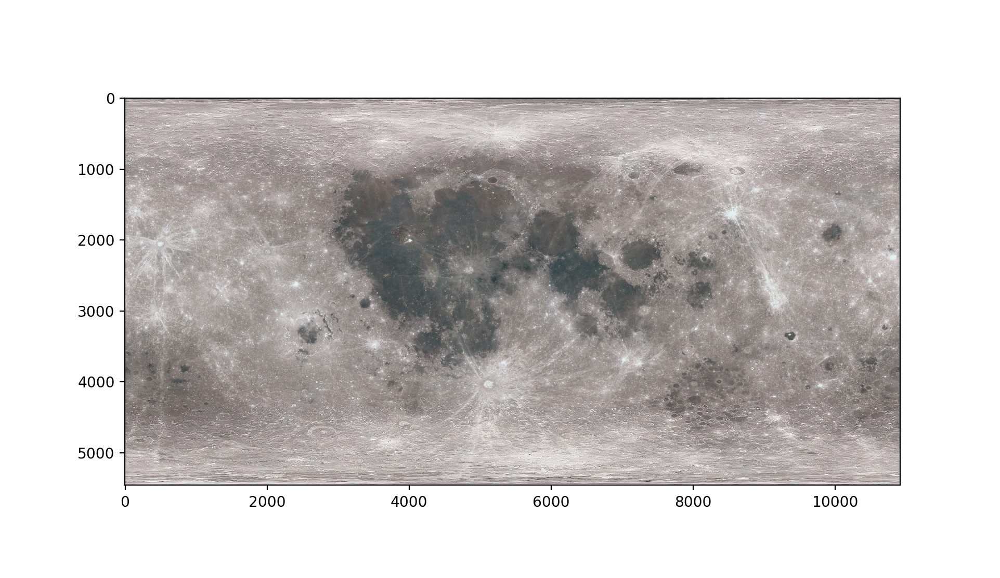

Dimensions: (5458, 10916, 3)
Data type: float32
Data range: 0.2 0.95
Size: 0.67 GB


In [7]:
color_src = cv2.imread(color_file)
color_src = color_src[..., ::-1].astype(np.float32) # convert from BGR to RGB, 32bit floating point
color_src = 0.2 + (0.75 / 255) * color_src  

plt.figure(2, figsize=(9.5, 5.5))
plt.tight_layout()
color_plot = plt.imshow(color_src)

print("Dimensions:", color_src.shape)
print("Data type:", color_src.dtype)
print("Data range:", np.min(color_src), np.max(color_src))
print("Size: %.2f GB" % (color_src.nbytes / (1024**3)))

### Star map.

Read the image, some downscaling.

<IPython.core.display.Javascript object>


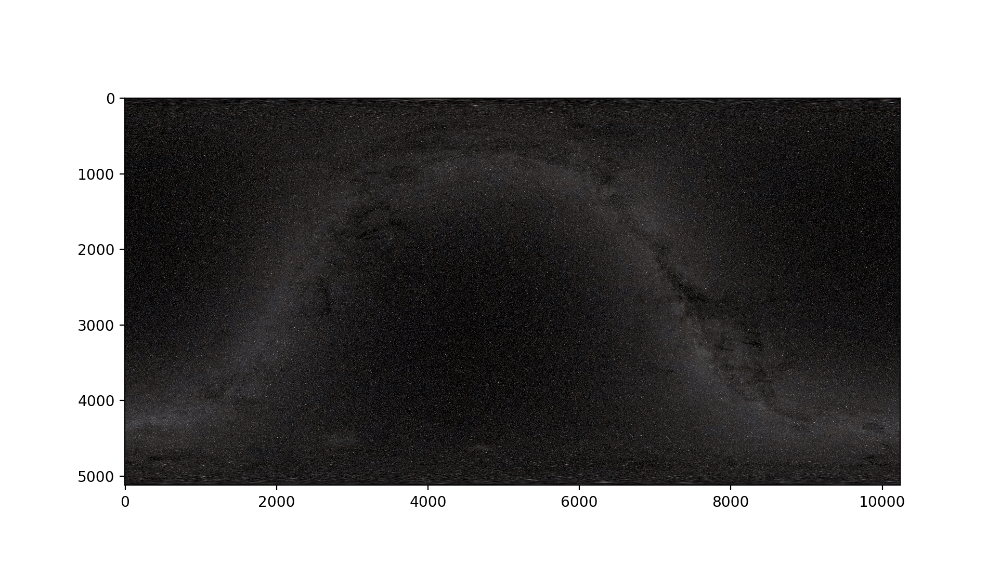

Dimensions: (5120, 10240, 3)
Data type: float32
Size: 0.59 GB


In [8]:
star_map_width = 10240 # target for downscaling from the original 16k width

star_src = cv2.imread(starmap_file)
star_src = star_src[..., ::-1].astype(np.float32) # convert from BGR to RGB, 32bit floating point
star_src *= 1 / 255

if star_map_width < star_src.shape[1]:
    star_map_height = int(star_src.shape[0] * star_map_width / star_src.shape[1])
    star_map_size = (star_map_width, star_map_height)
    star_map = cv2.resize(star_src, dsize=star_map_size, interpolation=cv2.INTER_CUBIC).astype(np.float32)
    np.clip(star_map, 0, 1, out=star_map) # clamp out-of-range interpolation results
    star_src = None
else:
    star_map = star_src

plt.figure(3, figsize=(9.5, 5.5))
plt.tight_layout()
color_plot = plt.imshow(np.sqrt(star_map)) # plot sqrt to boost faint lights

print("Dimensions:", star_map.shape)
print("Data type:", star_map.dtype)
print("Size: %.2f GB" % (star_map.nbytes / (1024**3)))

## 3. Setup ray-tracing with PlotOptiX.

See PlotOptiX [documentation](https://plotoptix.rnd.team) and [examples](https://github.com/rnd-team-dev/plotoptix/tree/master/examples) to learn more about ray tracing with this tool.

In [9]:
from plotoptix import NpOptiX, RtFormat
from plotoptix.materials import m_diffuse
from plotoptix.utils import make_color_2d

In [10]:
def update_image(rt):                        # update image in the figure
    imgplot.set_data(rt._img_rgba)
    plt.draw()

In [11]:
# create no-GUI ray tracing output, use callback to update image
width = 1100; height = 750
rt = NpOptiX(on_launch_finished=update_image, width=width, height=height)

rt.set_param(min_accumulation_step=2,        # 2 accumulation frames / image refresh
             max_accumulation_frames=50)     # accumulate 50 frames to remove noise

exposure = 0.9; gamma = 2.2                  # add tonal correction
rt.set_float("tonemap_exposure", exposure)
rt.set_float("tonemap_igamma", 1 / gamma)
rt.add_postproc("Gamma")

rt.set_background_mode("TextureEnvironment") # star map in the background
rt.set_background(star_map, gamma=gamma)
star_map = None

Use surface color as a texture of the predefined *diffuse* material. 

In [12]:
# first, setup a dummy 2x2 texture
m_diffuse["Textures"]=[
        {
          "Width": 2,
          "Height": 2,
          "DataArray": 2*2*4 * [1.0], # 2x2 RGBA, flat list
          "Format": RtFormat.Float4.value
        }
      ]
rt.update_material("diffuse", m_diffuse)

# then, update the dummy texture with the actual content
color_map = make_color_2d(color_src, gamma=gamma, channel_order="RGBA")
rt.update_material_texture("diffuse", color_map)
color_map = None

Create a single textured sphere object, ready to use a displacement map. U and V vectors are set to match the Moon orientation in the notebook with the mesh approach.

Try also ``NormalTilt`` mode. It is only shading the surface according to its inclination, not displacing it. It is super-fast but needs 2x memory for 2D tilt vectors, so you may need to downscale the elevation more.

In [13]:
displacement_mode = "DisplacedSurface"
#displacement_mode = "NormalTilt"

In [14]:
rt.set_data("moon", geom="ParticleSetTextured", geom_attr=displacement_mode,
            pos=[0, 0, 0], u=[0, 0, 1], v=[-1, 0, 0], r=10)

Setup camera, lights.

In [15]:
rt.setup_camera("cam1", cam_type="DoF",
                eye=[-13, -22, 3], target=[0, 0, 0], up=[0, 0.9, 0.5],
                aperture_radius=0.06, aperture_fract=0.2,
                focal_scale=0.62, fov=55)

rt.setup_light("light1", pos=[-50, 0, 0], color=60, radius=6)

Prepare inlined figure to show the ray tracing output.

<IPython.core.display.Javascript object>


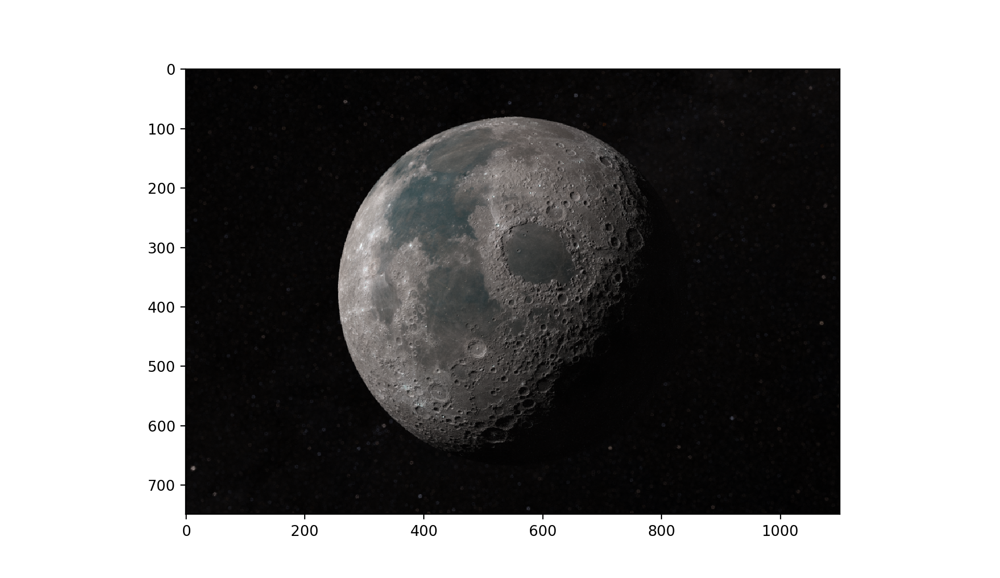

In [16]:
plt.figure(4, figsize=(9.5, 5.5))
plt.tight_layout()
imgplot = plt.imshow(np.zeros((height, width, 4), dtype=np.uint8))

Start ray tracing.

In [17]:
rt.start()

Set displacement map.

In [18]:
rmin = np.min(elevation)
rmax = np.max(elevation)
rv = rmax - rmin

# rescale "in place": 0.98 + (0.02/rv)*(elevation+rmin)
elevation += rmin
elevation *= 0.02 / rv
elevation += 0.98

rt.set_displacement("moon", elevation,
                    mapping="Spherical",
                    displacement=displacement_mode,
                    refresh=True)

Change the view.

In [20]:
# zoom in, note the mesh triangles
rt.update_camera("cam1", fov=5)

In [21]:
# fly close over the surface, more details would be nice!
rt.update_camera("cam1",
                 eye=[-3.44, -9.37, 1.67], target=[-4.61, -8.24, 1.55], up=[-1, -0.02, 0.05],
                 aperture_radius=0.005, focal_scale=0.92, fov=45)

In [22]:
# and another angle...
rt.update_camera("cam1",
                 eye=[-0.01, -6.02, 9.96], target=[-4.01, -3.75,  7.66], up=[-1, 0.07, 0.22],
                 aperture_radius=0.05, focal_scale=0.74, fov=33)

Have a fun and explore the Moon. Save your favorite view to a file.

In [23]:
rt.save_image("moon_displacement.jpg")

## 4. Bonus

The Moon in natural colors is a bit sad. Let's change that colors to show the elevation values.

In [24]:
from plotoptix.utils import map_to_colors # function to map values to matplotlib color palettes

In [25]:
downscale = 3
h = elevation.shape[0] // downscale
w = elevation.shape[1] // downscale

color_map = elevation.reshape(1, h, downscale, w, downscale).mean(4, dtype=np.float32).mean(2, dtype=np.float32).reshape(h, w)
color_map = map_to_colors(-color_map, "RdYlBu")
color_map = 0.95 * make_color_2d(color_map, gamma=gamma, channel_order="RGBA")
color_map = cv2.resize(color_map, dsize=(10240, 5120), interpolation=cv2.INTER_CUBIC).astype(np.float32)

rt.update_material_texture("diffuse", color_map)

Adjust image brightness to your taste with the exposure value.

In [ ]:
exposure = 2.0
rt.set_float("tonemap_exposure", exposure, refresh=True)

Close the ray tracing session.

In [26]:
rt.close()

## Thanks for running!

Hope you enjoyed the Moon. Try also the [triangular mesh](https://github.com/rnd-team-dev/plotoptix/blob/master/examples/3_projects/moon/making_the_moon__mesh__remote.ipynb) approach.

Visit us on [RnD Team](https://rnd.team) home page, or join us on social media: [Facebook](https://www.facebook.com/rndteam), [Behance](https://www.behance.net/RnDTeam) and [Instagram](https://www.instagram.com/rnd.team.studio).